# Prevendo condições climáticas

Utilizando dados históricos da [época da Segunda Guerra Mundial](https://www.kaggle.com/smid80/weatherww2), contruiremos um modelo para prever condições climáticas.

In [125]:
import pickle

import pandas as pd
import numpy as np

import statsmodels.api as sm
import pmdarima as pm
from statsmodels.tsa.stattools import adfuller

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns

## Análise exploratória + Pré-processamento

Baseado nas descrições dos datasets, filtramos as features relevantes para um modelo de previsão.  
Além do ID da estação metereológica, temperatura máxima, mínima e média (em grau Celsius), podemos utilizar a precipitação e a queda de neve (em mm).

In [3]:
df1 = pd.read_csv('Summary of Weather.csv')
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119040 entries, 0 to 119039
Data columns (total 31 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   STA          119040 non-null  int64  
 1   Date         119040 non-null  object 
 2   Precip       119040 non-null  object 
 3   WindGustSpd  532 non-null     float64
 4   MaxTemp      119040 non-null  float64
 5   MinTemp      119040 non-null  float64
 6   MeanTemp     119040 non-null  float64
 7   Snowfall     117877 non-null  object 
 8   PoorWeather  34237 non-null   object 
 9   YR           119040 non-null  int64  
 10  MO           119040 non-null  int64  
 11  DA           119040 non-null  int64  
 12  PRCP         117108 non-null  object 
 13  DR           533 non-null     float64
 14  SPD          532 non-null     float64
 15  MAX          118566 non-null  float64
 16  MIN          118572 non-null  float64
 17  MEA          118542 non-null  float64
 18  SNF          117877 non-

In [4]:
features = ['STA', 'Date', 'Precip', 'MaxTemp', 'MinTemp', 'MeanTemp', 'Snowfall']
weather_df = df1[features]

Tranformamos as datas em objetos `datetime` e utilizamos como índice:

In [5]:
weather_df['Date'] = weather_df['Date'].apply(pd.to_datetime)
weather_df = weather_df.set_index('Date')
weather_df.head()

,STA,Precip,MaxTemp,MinTemp,MeanTemp,Snowfall
Date,,,,,,
1942-07-01,10001,1.016,25.555556,22.222222,23.888889,0
1942-07-02,10001,0,28.888889,21.666667,25.555556,0
1942-07-03,10001,2.54,26.111111,22.222222,24.444444,0
1942-07-04,10001,2.54,26.666667,22.222222,24.444444,0
1942-07-05,10001,0,26.666667,21.666667,24.444444,0


Verificar os valores existentes na coluna `Precip`.  
Sabemos que deve conter valores numéricos representando precipitação em mm.

In [6]:
weather_df['Precip'].nunique()

540

São muitos valores únicos para verificar manualmente.  
Verificar os valores que contém algo diferente de dígitos e ponto:

In [7]:
weather_df['Precip'].str.extract(r'([^0-9.]+)')[0].unique()

array([nan, 'T'], dtype=object)

Os valores "T" (se referindo à "Trace") são inseridos quando há uma precipitação em quantidade não-mensurável.  
Convertemos estas entradas para `0`. 

Fonte: https://www.cocorahs.org/Content.aspx?page=faqdataentry

In [8]:
weather_df['Precip'].replace('T', 0, inplace=True)
weather_df['Precip'].fillna(0, inplace=True)
weather_df['Precip'] = weather_df['Precip'].astype('float32')

Verificar os valores existentes na coluna `Snowfall` da mesma forma:

In [9]:
weather_df['Snowfall'].str.extract(r'([^0-9.]+)')[0].unique()

array([nan, '#VALUE!'], dtype=object)

Consideramos que nas entradas sem valor não houve neve.
Considere, também, as entradas inválidas ("#VALUE!") como não havendo neve.

In [10]:
weather_df['Snowfall'].replace('#VALUE!', 0, inplace=True)
weather_df['Snowfall'].fillna(0, inplace=True)
weather_df['Snowfall'] = weather_df['Snowfall'].astype('float32')

Verificando os valores para procurar valores absurdos.

In [11]:
weather_df.describe()

,STA,Precip,MaxTemp,MinTemp,MeanTemp,Snowfall
count,119040.000000,119040.000000,119040.000000,119040.000000,119040.000000,119040.000000
mean,29659.435795,3.225612,27.045111,17.789511,22.411631,0.243054
std,20953.209402,10.801044,8.717817,8.334572,8.297982,2.613366
min,10001.000000,0.000000,-33.333333,-38.333333,-35.555556,0.000000
25%,11801.000000,0.000000,25.555556,15.000000,20.555556,0.000000
50%,22508.000000,0.000000,29.444444,21.111111,25.555556,0.000000
75%,33501.000000,0.762000,31.666667,23.333333,27.222222,0.000000
max,82506.000000,307.339996,50.000000,34.444444,40.000000,86.360001


In [36]:
fig = make_subplots(rows=2, cols=3,
    subplot_titles=[
        'MinTemp',
        'MaxTemp',
        'MeanTemp',
        'Precipitation',
        '',
        'Snowfall',
    ])

fig.add_trace(go.Histogram(
    x=weather_df['MinTemp'],
    name='MinTemp',
), row=1, col=1)

fig.add_trace(go.Histogram(
    x=weather_df['MaxTemp'],
    name='MaxTemp',
), row=1, col=2)

fig.add_trace(go.Histogram(
    x=weather_df['MeanTemp'],
    name='MeanTemp',
), row=1, col=3)

fig.add_trace(go.Box(
    x=weather_df['Precip'],
    name='Precipitation',
    boxpoints=False,
), row=2, col=1)

fig.add_trace(go.Box(
    x=weather_df['Snowfall'],
    name='Snowfall',
    boxpoints=False,
), row=2, col=3)

fig.show()

A princípio, os valores de temperatura parecem ok.

Os valores de precipitação e neve são bastante desbalanceados. Possui muitos valores nulos, mas existe uma faixa ampla de valores observados.

Para escolher uma localidade para estudar as condições metereológicas, começamos determinando se as estações possuem o mesmo número de medições.

In [13]:
weather_df[['STA', 'MeanTemp']].groupby('STA').agg('count').sort_values(by='MeanTemp', ascending=False)

,MaxTemp
STA,
22508,2192
10701,2185
22502,2154
22504,2118
10803,1750
...,...
42206,50
33123,47
43307,46


A estação 22508 possui um maior número de medições.  
Por possuir um maior número de dados, escolhemos esta estação para estudo.

In [14]:
temp_df = weather_df[weather_df['STA'] == 22508]
print(f"Data de início: {temp_df.index.min()}, data de término: {temp_df.index.max()}. Dias: {temp_df.index.max() - temp_df.index.min()}")

Data de início: 1940-01-01 00:00:00, data de término: 1945-12-31 00:00:00. Dias: 2191 days 00:00:00


Como há um intervalo de 2191 dias entre a primeira e última data e há 2192 linhas, este conjunto de dados parece estar completo com leituras diárias.

In [15]:
temp_df.index

DatetimeIndex(['1940-01-01', '1940-01-02', '1940-01-03', '1940-01-04',
               '1940-01-05', '1940-01-06', '1940-01-07', '1940-01-08',
               '1940-01-09', '1940-01-10',
               ...
               '1945-12-22', '1945-12-23', '1945-12-24', '1945-12-25',
               '1945-12-26', '1945-12-27', '1945-12-28', '1945-12-29',
               '1945-12-30', '1945-12-31'],
              dtype='datetime64[ns]', name='Date', length=2192, freq=None)

Especificamos que a frequência da coleta de dados foi diária:

In [ ]:
weather_df = weather_df.asfreq('D')
weather_df.index

## Escolha de um modelo

Para esta análise, tentaremos prever a temperatura média `MeanTemp`.  
Primeiro, verificamos o comportamento rapidamente observando o gráfico:

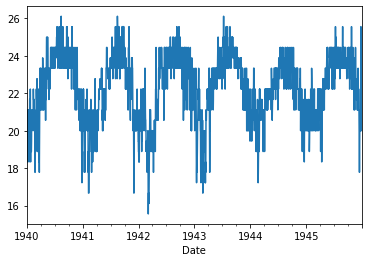

In [17]:
temp_df['MeanTemp'].plot()

Como esperado, a temperatura apresenta uma sazonalidade. No início/final de cada ano as temperaturas são consistentemente menores e sobe até atingir o máximo no meio do ano.  
Podemos concluir que essas temperaturas foram medidas em alguma região do hemisfério norte, já que as temperaturas são consistentes com os períodos de inverno/verão.

Poderíamos utilizar os dados de precipitação e queda de neve como variáveis exógenas.  
A princípio, utilizamos somente os dados históricos da temperatura nesta análise.

In [18]:
y = temp_df['MeanTemp']

Um dos métodos mais utilizados para previsões de séries temporais com comportamento sazonal é o SARIMA.  
Começamos verificando se nossos dados são estacionários observando o comportamento da média anual.

In [19]:
yearly_mean = y.rolling(window=365, center=True).mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=y.index,
    y=y,
    fill=None,
    mode='lines',
    line=dict(width=1),
    name='MeanTemp',
    ))

fig.add_trace(go.Scatter(
    x=yearly_mean.index,
    y=yearly_mean,
    fill=None,
    mode='lines',
    line=dict(width=2, color='black'),
    name='YearlyMeanTemp',
    ))

fig.show()

A princípio, o comportamento parece estacionário.  
Para termos certeza, aplicamos o teste de Dickey-Fuller aumentado:

In [20]:
print("p-value:", adfuller(y)[1])

p-value: 2.4721092430840836e-23


Como p-value < 0.05, podemos dizer que nosso dado é estacionário e podemos usar o método SARIMA.

## Modelo de previsão SARIMA

Como a sazonalidade dos nossos dados é anual e os dados são coletados diariamente, o período da sazonalidade é de 365 (dias/ano).  
Na prática, esse período é muito grande para os métodos ARIMA.

Para contornar esta limitação, assumimos que as temperaturas não variam muito dentro de uma semana.  
Assim, analisamos as médias semanais, e agora o período da sazonalidade é de 52 (semanas/ano).

In [21]:
y = y.resample('W').mean()

Temos dados de um período de 6 anos. Para fins de avaliação do modelo, separamos os primeiros 5 anos para treino e o último para validação.

In [58]:
cutoff = -53
y_train = y[:cutoff]
y_valid = y[cutoff:]

## Modelo Baseline

Antes de começar a treinar um modelo SARIMA, definimos um modelo base "ingênuo" para avaliação.

Como gostaríamos de realizar previsões "fora do intervalo" para o ano seguinte, podemos prever que as temperaturas ao longo do ano serão iguais às temperaturas do ano anterior. Apesar de ingênuo, este modelo costuma ter uma boa precisão para dados "cíclicos".

In [60]:
baseline_pred = y_train[-y_valid.shape[0]:]

Para avaliação dos modelos, podemos utilizar a métrica RMSE (Root Mean Square Error).

In [37]:
def rmse(forecast, observed):
    return np.sqrt(np.mean((forecast - observed)**2))

In [48]:
print("RMSE do modelo base:", rmse(baseline_pred.values, y_valid.values))

RMSE do modelo base: 0.8758699839710694


## Determinação dos melhores parâmetros SARIMA

Utilizamos o `pmdarima.auto_arima` para determinar os melhores parâmetros.  
Como já estamos utilizando um período relativamente grande para modelos sazonais, limitamos os parâmetros p e q para 3.  
Além disso, como verificamos anteriormente que nossos dados são estacionários desconsiderando a sazonalidade, podemos fixar o parâmetro d em 0.

Para verificar o parâmetro D, observamos o comportamento do gráfico quando subtraímos os dados defasados em um ciclo de sazonalidade. Isto é, quando subtraímos as temperaturas de um ano das temperaturas do ano anterior.

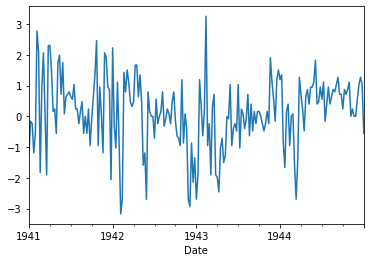

In [63]:
(y_train.shift(52) - y_train).dropna().plot()

A princípio, os padrões de sazonalidade parecem ter desaparecido ao aplicar essa diferenciação.  
Fixamos o parâmetro D em 1.

In [22]:
auto_model = pm.auto_arima(y_train, start_p=1, start_q=1,
                         test='adf',
                         max_p=3, max_q=3, m=52,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

auto_model.summary()

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[52] intercept   : AIC=inf, Time=48.94 sec
 ARIMA(0,0,0)(0,1,0)[52] intercept   : AIC=651.045, Time=0.62 sec
 ARIMA(1,0,0)(1,1,0)[52] intercept   : AIC=583.189, Time=14.16 sec
 ARIMA(0,0,1)(0,1,1)[52] intercept   : AIC=inf, Time=53.33 sec
 ARIMA(0,0,0)(0,1,0)[52]             : AIC=651.735, Time=0.40 sec
 ARIMA(1,0,0)(0,1,0)[52] intercept   : AIC=629.097, Time=1.84 sec
 ARIMA(1,0,0)(2,1,0)[52] intercept   : AIC=inf, Time=56.57 sec
 ARIMA(1,0,0)(1,1,1)[52] intercept   : AIC=inf, Time=65.41 sec
 ARIMA(1,0,0)(0,1,1)[52] intercept   : AIC=inf, Time=52.72 sec
 ARIMA(1,0,0)(2,1,1)[52] intercept   : AIC=inf, Time=199.83 sec
 ARIMA(0,0,0)(1,1,0)[52] intercept   : AIC=614.138, Time=9.98 sec
 ARIMA(2,0,0)(1,1,0)[52] intercept   : AIC=585.170, Time=18.01 sec
 ARIMA(1,0,1)(1,1,0)[52] intercept   : AIC=583.930, Time=41.31 sec
 ARIMA(0,0,1)(1,1,0)[52] intercept   : AIC=585.538, Time=14.81 sec
 ARIMA(2,0,1)(1,1,0)[52] intercept   : AIC=585

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  261
Model:             SARIMAX(1, 0, 0)x(1, 1, 0, 52)   Log Likelihood                -288.038
Date:                            Sun, 01 Nov 2020   AIC                            582.076
Time:                                    21:28:15   BIC                            592.103
Sample:                                         0   HQIC                           586.130
                                            - 261                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3907      0.058      6.735      0.000       0.277       0.504
ar.S.L52      -0.5127      0.052     -9.870      0.000      -0.614      -0.411
sigma2         0.8537      0.084     10.162      0.000       0.689       1.018
===================================================================================
Ljung-Box (Q):                       43.42   Jarque-Bera (JB):                 0.56
Prob(Q):                              0.33   Prob(JB):                         0.76
Heteroskedasticity (H):               0.43   Skew:                             0.00
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.25
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Avaliação do modelo

Verificando o RMSE do modelo encontrado:

In [72]:
y_pred = auto_model.predict(53)
print("RMSE do modelo SARIMA:", rmse(y_pred, y_valid.values))

RMSE do modelo SARIMA: 0.783124528809053


Nosso modelo SARIMA prevê melhor que nosso modelo ingênuo.  
Podemos melhorar o modelo verificando o bias:

In [76]:
bias = np.mean(y_pred - y_valid.values)
print("Bias:", bias)

Bias: -0.30947790110622336


Nosso modelo prevê, em média, aproximadamente 0,31 graus abaixo do conjunto de validação.  
Podemos melhorar as previsões eliminando o bias:

In [78]:
print("RMSE do modelo SARIMA corrigindo o bias:", rmse(y_pred - bias, y_valid.values))

RMSE do modelo SARIMA corrigindo o bias: 0.7193799109992494


Uma observação quanto à esta correção:  
É preciso avaliar cuidadosamente esta aplicação do bias. A princípio, estamos utilizando informações dos dados de validação para melhorar o modelo, o que não é indicado.  
Além disso, é preciso estudar a causa do bias. Se nosso modelo previu temperaturas abaixo das observadas, talvez haja uma tendência nos dados indicando um aumento consistente da temperatura ao longo dos anos (aquecimento global, talvez?).

Observando o histograma dos residuais, podemos verificar rapidamente se faria sentido aplicarmos essa correção do bias.

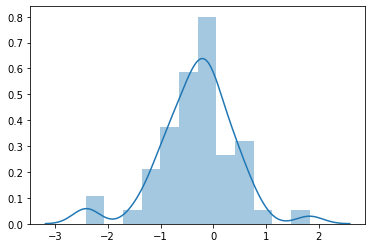

In [88]:
sns.distplot(y_pred - y_valid.values)

O comportamento dos residuais se aproxima de uma gaussiana com um bias.  
Como não parece haver uma assimetria, faria sentido corrigir o bias.

Apesar disso, não podemos ignorar o fato de estarmos utilizando dados da validação para observar o bias, além de podermos estar diminuindo a precisão do modelo como um todo.

In [89]:
# Salvando o modelo para uso futuro
 with open('auto_model.pkl', 'wb') as f:
     pickle.dump(auto_model, f)

## Visualização das previsões

In [222]:
def plotarima(y_train, y_valid, automodel, conf_int=True):
    # Adaptado de: https://towardsdatascience.com/arima-forecasting-in-python-90d36c2246d3

    # Prevê o último ano dos dados de treino
    pred_end = y_train.index.shape[0]
    pred_start = pred_end - 52

    if conf_int:
        fc1, confint1 = auto_model.predict_in_sample(
            start=pred_start,
            end=pred_end,
            return_conf_int=True,
            )
    else:
        fc1 = auto_model.predict_in_sample(
            start=pred_start,
            end=pred_end,
            )

    # Prevê um ano além dos dados de treino
    if conf_int:
        fc2, confint2 = auto_model.predict(
            n_periods=y_valid.index.shape[0],
            return_conf_int=True,
            )
    else:
        fc2 = auto_model.predict(
            n_periods=y_valid.index.shape[0],
            )

    fc = np.concatenate([fc1, fc2])

    if conf_int:
        confint = np.concatenate([confint1, confint2])

    # Forecast index
    fc_ind = pd.date_range(
        start=y_train.index[-53],
        end=y_valid.index[-1],
        freq='W',
        )

    # Forecast series
    fc_series = pd.Series(fc, index=fc_ind)

    # Upper and lower confidence bounds
    if conf_int:
        lower_series = pd.Series(confint[:, 0], index=fc_ind)
        upper_series = pd.Series(confint[:, 1], index=fc_ind)

    # Create plot
    plt.figure(figsize=(10, 6))
    plt.plot(y_train)
    plt.plot(y_valid)
    plt.plot(fc_series, color="red")
    plt.xlabel("date")
    plt.ylabel('MeanTemp')
    if conf_int:
        plt.fill_between(lower_series.index, 
                            lower_series, 
                            upper_series, 
                            color="k", 
                            alpha=0.25)
        plt.legend(("y_train", "y_valid", "Forecast", "95% confidence interval"),  
                    loc="upper left")
    else:
        plt.legend(("y_train", "y_valid", "Forecast"),
                    loc="upper left")
    plt.show()

Colocando os dados de treino, teste e os valores previstos no mesmo gráfico:

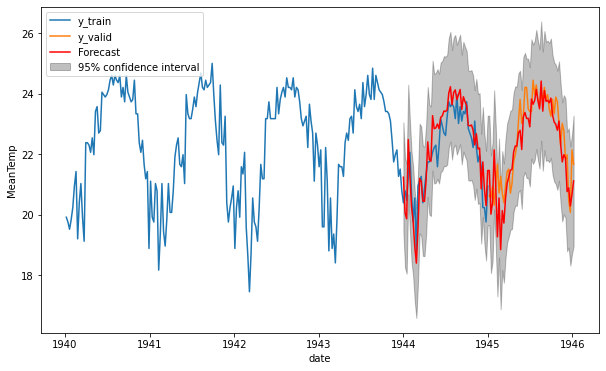

In [123]:
plotarima(y_train, y_valid, auto_model)

O modelo parece descrever bem os dados de treino (dados de 1944) e os dados de validação (dados de 1945).

## Visualizando a localização da estação metereológica

In [127]:
data2 = pd.read_csv("Weather Station Locations.csv")
data2.head()

,WBAN,NAME,STATE/COUNTRY ID,LAT,LON,ELEV,Latitude,Longitude
0,33013,AIN EL,AL,3623N,00637E,611,36.383333,6.650000
1,33031,LA SENIA,AL,3537N,00037E,88,35.616667,0.583333
2,33023,MAISON BLANCHE,AL,3643N,00314E,23,36.716667,3.216667
3,33044,TELERGMA,AL,3607N,00621E,754,36.116667,6.416667
4,12001,TINDOUF,AL,2741N,00809W,443,27.683333,-8.083333


Definimos o número da estação como índice:

In [139]:
data2 = data2.set_index('WBAN')

Adicionamos o número de observações metereológicas em uma nova coluna:

In [144]:
data2 = data2.join(weather_df[['STA', 'MeanTemp']].groupby('STA').agg('count')).rename(columns={'MeanTemp': 'Observations'})
data2.head()

,NAME,STATE/COUNTRY ID,LAT,LON,ELEV,Latitude,Longitude,Observations
WBAN,,,,,,,,
33013,AIN EL,AL,3623N,00637E,611,36.383333,6.650000,383.0
33031,LA SENIA,AL,3537N,00037E,88,35.616667,0.583333,1121.0
33023,MAISON BLANCHE,AL,3643N,00314E,23,36.716667,3.216667,996.0
33044,TELERGMA,AL,3607N,00621E,754,36.116667,6.416667,502.0
12001,TINDOUF,AL,2741N,00809W,443,27.683333,-8.083333,818.0


Observamos as localizações das estações metereológicas.  
Centramos o mapa, inicialmente, na estação em que realizamos o estudo.

In [147]:
fig = px.scatter_mapbox(
    data2,
    lat="Latitude",
    lon="Longitude",
    zoom=4,
    hover_data=[data2.index, 'NAME', 'Observations'],
    center=dict(
        lat=data2.loc[22508, 'Latitude'],
        lon=data2.loc[22508, 'Longitude']
    ))
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Conclusão

O método SARIMA utilizado para modelar as condições climáticas obteve um desempenho melhor do que o modelo base, dado que as temperaturas registradas ao longo de um ano apresentam um comportamento sazonal.

Talvez seja possível melhorar ainda mais o modelo utilizando os dados de precipitação ou queda de neve como variáveis exógenas.

Também pode ser possível utilizar dados de estações próximas para auxiliar na previsão, construindo um modelo multidimensional e avaliando o gradiente da temperatura.

Outros aspectos de interesse para se analisar são os dados de más condições climáticas. Cada uma das condições (chuva, neve, tempestades) requer uma análise/modelagem à parte, o que levaria mais tempo.